In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

In [ ]:
removed_features = ["african_restaurant", "accepts_credit_cards", 'caucasian_restaurant', "halal_restaurant", 
                    "mac_&_cheese_joint", "restaurant", "fondue_restaurant"
                   
                   ]

removed_restaurants = ['A Place To B', 'A&W Restaurant', "AECSA Kitchen 5", "Ai Sushi", "Boulder Airport Taxi",
                 "Burger King", "Caribou Coffee - Coming Soon!", "Dairy Queen", "Domino's Pizza", "Dunkin'", 
             "Einstein Bros Bagels", "Gallery", "McDonald's", "Pizza Hut", "CU Eng. Celestial Seasonings",
                       "CU: Farrand Emporium","CU: Farrand Hall","CU: Leeds School of Business", "CU: Libby Dining Hall",
                       "CU: Sewall Dining Hall", "Dennys", "Jimmy John's", "KFC", "Papa John's Pizza", "ستاربكس النزهة",
                       "فيصل ساندوشت","Alba Ristorante", "Alexanders Restaurant", "Alferd Packer Grill @ UMC",
                       "Ares Thrift Shop", "Asian Deli", "Baby Does", "Barista Bar", "BDW Rooftop", "Beat Book Shop",
                       "Belgian Bakery", "Belvedere Belgian Chocolate Shop", "Big Daddy's Texas BBQ", "Bj's Restaurant and Brewery - Boulder",
                       "Black-Eyed Pea Restaurant", "Blue Zone", "Bodywork Bistro Living Arts Studio", "Bodyworks Bistro",
                       "Book End Cafe", "boulder bowls", "Boulder Creek Market", "Bow Tie Cafe & Spirits", "Brooklyn Heroes",
                       "C&E Concessions Boulder", "C4C Dining Hall", "C5C", "CAC Boulder River Cabin", "Café Che",
                       "Cafe Food", "Cafe Rio", "Candy Shop Hydroponics and Organic Grow Center", "Center For Community (C4C)",
                       "Centro Latin Kitchen & Refreshment Palace", "Charley and Danis", "Chiefin Buds Smoke Shop", "Chinese Dumpling House",
                       "Chip's Corral", "Cholaca", "Colorado Swim Shop", "Courtyard Cafe", "Covidien R&MS", "Crystal Ski Shop",
                       "Cuvée Wine Bar & Bistro", "Del Taco", "Dinner Club", "Donahue Neal", "Dubach Sue", "Eads News And Smoke Shop",
                       "Earl’s Saw Shop", "Eco-Cuisine, Inc.", "Eggloo Delights", "El Rey Taqueria", "Emmerson", 
                       "Espressario Coffee Shop", "Espressoria", "Etai's", "Falafels & Gyros @ Boulder Farmers Market",
                       "Farrand Grab N Go", "Fig's Catering", "Fior", "Folsom Street Coffee", "Food Fresh", 
                       "Freebird Beauty Shop", "French Quarter Brasserie and Oyster Bar", "Fresh Thymes Marketplace", 
                       "Friends With Benny's", "Geisty's Dogg House", "Go Far Outdoor Shop", "Google - Red Rocks Cafe",
                       "Goorin Bros. Hat Shop - West Pearl Street", "Green Rush Cafe", "Gurkhas Restaurant", "Gyro Stand",
                       "Heirloom Food Truck", "Hilltop Food Court", "Hilton Garden Inn - The Garden Grill", "Hospice Thrift Shop",
                       "Hyatt Place Boulder/Pearl Street", "Hyatt Place Boulder/Pearl Street Gym", "IHOP", "Java Hut",
                       "Java Junction", "Juanita's Mexican Food", "Juiced! Organic Market and Juicery & Boulder Boucherie",
                       "Julia's Kitchen", "K's China", "Kim Vietnamese", "Kosher", "La Chosa Taco Wagon", "La Mariposa Restaurant",
                       "Lee Yuan Chinese Cuisine", "Leffler's Vitamin Shop", "Little Caesars", "Lookout Cafe & Cocktails", "Loomis Kitchen",
                       "Love and Cupcakes", "LuLu's High-Country Kitchen", "Mad Greens Boulder", "Madison's Cheese Press", 
                       "Mami's Authentic Mexican Cuisine", "Mandala Infusion", "Marley Coffee Bike Caffe-Crispin Porter + Bogusky", 
                       "Maywah", "Maywah Chinese and Vietnamese Restaurant", "Mediterranean Bakery", "Milo's", "Milo's Pizza & Po' Boys",
                       "Moe's Broadway Bagels", "Moongate Asian Bistro", "Namaste", "NaRaya", "NaRaYa Thai and Sushi",
                       "Naropa Cafe", "Nathan And Dave's Kitchen!", "Natural Temptations", "No Place Like Home",
                       "North Boulder Cafe", "Oskar Blues Bonewagon", "Oskar Blues CHUBurger Wagon", "Page Two",
                       "Panda Express", "Panera Bread", "Papa Murphy's", "Patty Elliott's Place", "Peace pipe", 
                       "Peachy’s Superfruit Cafe", "Peet's Coffee & Tea", "Pekoe Sip House", "Per La Gente", 
                       "Perry's Shoe Shop", "PMG", "Qdoba Mexican Grill", "Safeway", "Shady place to drink along the creek",
                       "Quarantine", "Queen’s Kitchen Hot Pot Spicy Noodle House", "Quiznos", "Raglin Market", 
                       "Rolling Greens @ Tendril", "S Club7", "Salt Box", "Savory Cuisines Catering", "Seeds Library Cafe",
                       "Sewall Hall", "Shaggys Famous Poutine", "Si Senor Real Mexican Food", "Silver Mine Subs", 
                       "Smooch Frozen Yogurt & Mochi", "Sobo Cafe", "South Boulder Social Club", "Spaceman USA",
                       "Span-ish", "Spicy Pickle", "Spruce Confections", "Squared Pizza + Beer", "Streat Chefs",
                       "Suburban Wiener", "Sushi Thai Happiness Eggloo", "Tasterie Truck", "Terra Thai", 
                       "Terrapin Care Station Rec Shop", "Teso Food Truck", "Thai Kitchen", "The Bakery",
                       "The Boulder Sub Co", "The Bounce Place At Boulder", "The old Same place", "The Red Lion", "The Sushi Spot",
                       "Thyme On The Creek", "Tiger Sliderz", "Tokyo Joe's", "Tom's Tavern", "Top Of The Hill Grill West", 
                       "Tortilleria y Taqueria El Rey", "Trep Cafe", "TRUCK IT! Boulder Food Truck Party", 
                       "Tsing Tao", "Udi's Bread Café - CU East Campus", "Undocumented Pedro's", "University of Colorado: Community Dining Center",
                       "Up Dog Cafe", "V.G. Burgers", "Varun's Tea House", "Walnut A Go Go", "Weather Tech Cafe", 
                       "West End Wine Shop", "West Flanders Brewing Company", "Whole Foods Market", "Williams Village Grab n' Go",
                       "World Cafe", "YeYe Cafe", "Yoyo's", "Yoyo's Frozen Yogurt Bar", "Zeal - Food for Enthusiasts", 
                       "Zoë's Kitchen", "zpizza"             
                       
            ]

repeated_restaurants = ["Abo's Pizza", "Deli Zone", "eureka", "Firehouse Subs", "Five Guys", "Gelato Boy",
              "Glacier Homemade Ice Cream", "Good Times Burgers & Frozen Custard","Hapa Sushi Grill and Sake Bar",
                     "Illegal Pete's", "Jamba Juice", "Rush Bowls", "Starbucks", "SUBWAY", "Taco Bell", "Wendy's",
                     "Allegro Coffee Company", "Alpine Modern Shop", "Alpine Modern Coffee", "Blackjack Pizza",
                        "Brewing Market", "Celestial Seasonings Cafe", "Fuji", "KT's BBQ", "La Choza", "Lucky's Bakehouse",
                        "McDevitt Taco Supply", "motomoki", "Mt. Everest Cuisine", "Murphy’s Grill", "Nick-N-Willy's",
                        "Noodles & Company", "Ozo Coffee", "Proto's Pizza", "Rio Grande", "Rueben's Burger Bistro",
                        "Salvaggio's Italian Deli", "Sanchos", "seb's woodfire pizza", "Snarf's Sandwiches", 
                        "Spruce Confections", "Sweet Cow", "The Laughing Goat, Norlin Library", "Verde","Verde Burrito Truck",
                        "Vic's Coffee", "Wonder" 
                       
                    ]

In [15]:
df = pd.read_csv('boulder_clean.csv')

In [16]:
df.head()

,name,ethiopian_restaurant,american_restaurant,new_american_restaurant,asian_restaurant,chinese_restaurant,japanese_restaurant,korean_restaurant,noodle_house,thai_restaurant,tibetan_restaurant,vietnamese_restaurant,bbq_joint,bagel_shop,bakery,bistro,breakfast_spot,bubble_tea_shop,burger_joint,cafeteria,café,cajun_or_creole_restaurant,coffee_shop,comfort_food_restaurant,deli_or_bodega,dessert_shop,cupcake_shop,frozen_yogurt_shop,ice_cream_shop,diner,donut_shop,fast_food_restaurant,fondue_restaurant,food_court,food_truck,french_restaurant,fried_chicken_joint,gastropub,german_restaurant,gluten-free_restaurant,greek_restaurant,hot_dog_joint,indian_restaurant,italian_restaurant,juice_bar,latin_american_restaurant,mediterranean_restaurant,mexican_restaurant,burrito_place,taco_place,middle_eastern_restaurant,pizza_place,salad_place,sandwich_place,seafood_restaurant,southern_or_soul_food_restaurant,spanish_restaurant,tapas_restaurant,steakhouse,tea_room,vegetarian_or_vegan_restaurant,wings_joint,has_outdoor_seating,takes_reservations,breakfast,brunch,lunch,dinner,wine,does_delivery,live_music,beer,cocktails,full_bar,dessert,happy_hour,table_service,wheelchair_accessible,parking,price_tier_1,price_tier_2,price_tier_3,price_tier_4,has_wifi
0,3 Margaritas,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,85 Dewey,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,A Cup Of Peace,0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Abbys coffee,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Abo's Pizza,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
df.fillna(0, inplace = True)
df['ethiopian_restaurant']
df['southern_or_soul_food_restaurant']

In [17]:
df.drop(columns=['ethiopian_restaurant', 'southern_or_soul_food_restaurant'], inplace=True)

In [47]:
df = df[df['name']!="Abbys Coffee"]

KeyError: 'name'

In [20]:
df.shape

(319, 82)

In [21]:
df.drop(columns=['brunch', 'lunch', 'dinner'], inplace=True)

In [23]:
df.shape

(319, 79)

In [24]:
def save_df_as_csv(final_df, name_csv):
    final_df.to_csv(name_csv, encoding='utf-8', index=False)

In [29]:
save_df_as_csv(df, "boulder_nmf.csv")

In [26]:
df.fillna(0, inplace = True)
df.set_index('name', inplace = True)

In [30]:
df.head()

,american_restaurant,new_american_restaurant,asian_restaurant,chinese_restaurant,japanese_restaurant,korean_restaurant,noodle_house,thai_restaurant,tibetan_restaurant,vietnamese_restaurant,bbq_joint,bagel_shop,bakery,bistro,breakfast_spot,bubble_tea_shop,burger_joint,cafeteria,café,cajun_or_creole_restaurant,coffee_shop,comfort_food_restaurant,deli_or_bodega,dessert_shop,cupcake_shop,frozen_yogurt_shop,ice_cream_shop,diner,donut_shop,fast_food_restaurant,fondue_restaurant,food_court,food_truck,french_restaurant,fried_chicken_joint,gastropub,german_restaurant,gluten-free_restaurant,greek_restaurant,hot_dog_joint,indian_restaurant,italian_restaurant,juice_bar,latin_american_restaurant,mediterranean_restaurant,mexican_restaurant,burrito_place,taco_place,middle_eastern_restaurant,pizza_place,salad_place,sandwich_place,seafood_restaurant,spanish_restaurant,tapas_restaurant,steakhouse,tea_room,vegetarian_or_vegan_restaurant,wings_joint,has_outdoor_seating,takes_reservations,breakfast,wine,does_delivery,live_music,beer,cocktails,full_bar,dessert,happy_hour,table_service,wheelchair_accessible,parking,price_tier_1,price_tier_2,price_tier_3,price_tier_4,has_wifi
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3 Margaritas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
A Cup Of Peace,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Abbys coffee,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Abo's Pizza,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
Ado's Kitchen and Bar,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [31]:
def get_latent_topics(df):

    mat = df.values
    categories = df.columns
    names = df.index
    k = 9 
    topics = ['latent_topic_{}'.format(i) for i in range(k)]

    nmf = NMF(n_components = k)
    nmf.fit(mat)

    W = nmf.transform(mat)
    H = nmf.components_

    W = pd.DataFrame(W, index = names, columns = topics)
    H = pd.DataFrame(H, index = topics, columns = categories)

    W,H = (np.around(x,3) for x in (W, H))
    return W, H

In [42]:
cos_sim = pd.DataFrame(sklearn.metrics.pairwise.cosine_similarity(W, W, dense_output=True), columns=df.index, index=df.index)

In [44]:
cos_sim.columns = [col.lower().replace(' ', '_') for col in cos_sim.columns]

In [60]:
cos_sim

,3_margaritas,a_cup_of_peace,abbys_coffee,abo's_pizza,ado's_kitchen_and_bar,agave_mexico_bistro_&_tequila_house,akiyama_sushi_bar_and_grill,alforat_resturant,alibaba_grill,allegro_coffee_roasters,aloy_thai_cuisine,alpine_modern_cafe,altitude_cafe,amante_baseline,amante_coffee,amante_uptown,ampersand_coffee,amu,aoi_sushi_and_izakaya,aperitivo,arabesque,arcana,attic_bar_&_bistro,audrey_jane's_pizza_garage,bacco_trattoria_&_mozzarella_bar,backcountry_pizza_&_tap_house,bartaco_boulder,basta,beleza_coffee_bar,ben_&_jerry's,bento-ria,big_city_burrito,big_daddy_bagels,bj's_restaurant_&_brewhouse,black_cat,black_pepper_pho,blackbelly,blackjack_pizza_&_salads,bohemian_biergarten,bona_coffee_roasters,boss_lady_pizza,boulder_baked,boulder_chophouse_&_tavern,boulder_cork,boulder_pho,boulder_salad,boxcar_coffee_roasters,bramble_&_hare,brasserie_ten_ten,breadworks_bakery_&_cafe,breakfast_champion,brewing_market,brooklyn_pizza,buddha_cafe,burger_radio,cafe_aion,cafe_blue,cafe_mexicali,caffè_sole,california_pizza_kitchen,canyon's_restaurant_&_bar,carabiner_coffee_co.,carelli's_restaurant,caspian_mediterranean_deli_and_grocery,celestial_seasonings,centro_mexican_kitchen,chautauqua_dining_hall,cheba_hut_toasted_subs,chez_thuy,chimera,chipotle_mexican_grill,cilantros_mexican,cold_stone_creamery,comida_taco_truck,corrida,cosmo's_pizza,crepes_to_go_go,cuban_fusion,curry_n_kebob,d'angelo's_italian_deli,dagabi_cucina,davey's_diner,deli_at_flatiron_park,deli_zone,diaz_farm_taco_truck,dish_gourmet,dot's_diner,dot's_diner_on_the_hill,doug's_day_diner,dushanbe_teahouse,"eco-cuisine,_inc.",efrains_ii_mexican_food_restaurant,element_bistro,esteban's,etai's_bakery_cafe,eureka!,extreme_pita,falafel_king,fast_eddie's_famous_chicago_hot_dogs,fat_shack_-_boulder,figure_grounds,fior_di_latte,firehouse_subs,five_guys,five_on_black,five_spice_asian_cuisine,flagstaff_house_restaurant,flatiron_coffee,flower_child,flower_pepper,folsom_thai,foolish_craig's_cafe,frasca_food_and_wine,freeze,fresh_thymes_eatery,fuji_cafe_and_bar,gaku_ramen,garbanzo_mediterranean_fresh,gather,gelato_boy,glacier_homemade_ice_cream_&_gelato,gold_hill_inn,golden_sun,gondolier_italian_eatery,good_times_burgers_&_frozen_custard,goody_monster,great_harvest_bread_company,gurkhas_on_the_hill,häagen-dazs,half_fast_subs,hana_sushi,haoway_chinese_cafe,hapa_sushi_grill_and_sake_bar,heifer_and_the_hen,il_pastaio,illegal_pete's,innisfree_poetry_bookstore_and_cafe,insomnia_cookie,izote_latin_foods_truck,jaipur_indian_restaurant,jamba_juice,japango,jason's_deli,jax_fish_house_boulder,jill's_restaurant_&_bistro,jin_chan,kalita_grill_greek_café,kasa_japanese_grill_&_bar,kathmandu_restaurant_ii,khow_thai_cafe,kilwins,kim_&_jake's_cakes,kim's_food_to_go,korea_house_-_boulder,kt's_bbq,ku_cha_house_of_tea,kung_fu_tea,l'atelier,la_choza,la'au's,larkburger,lazy_dog_sports_bar_&_grill,le_french_café,le_frigo,le_peep,leaf_vegetarian_restaurant,lindsay's_boulder_deli,little_tibet_restaurant_and_bar,logan's_espresso_cafe,lollicup,los_dos_bros,lucile's,lucky's_bakehouse_&_creamery,lucky's_cafe,mad_greens,mateo,may_wah_cuisine,mcdevitt_taco_supply,miller's_bbq_food_truck,modmarket,moe's_bagels,moe's_original_bar_b_que,motomaki,mount_everest_cuisine,mountain_sun_pub_&_brewery,murphy's_south,mustard's_last_stand,my_ramen_&_izakaya,native_foods,nepal_cuisine,next_door_boulder,nick_and_willy's_take_and_bake_pizza,noodles_&_company,nothing_bundt_cakes,oak_at_fourteenth,oregano's_pizza_bistro,organic_sandwich_company,osaka's,oskar_blues,ozo_coffee,papa_murphy's,parkway_cafe,passport_traveling_eatery,pasta_jay's,pei_wei,pekoe_sip_house,pho_kitchen,pica's_mexican_taqueria,pizza_colore,pizzarev,pizzeria_locale,potbelly_sandwich_shop,protein_bar_&_kitchen,proto's_pizza,ralphie's_sports_bar_and_grill,ras_kassa's_ethiopian,rat's_wood_shack,red_rock_coffee_house,riffs_urban_fare,rincon_argentino,rincon_del_sol,rio_grande,ripple_pure_frozen_yogurt,river_and_woods,rolling_greens_food_truck,roxie's_tacos,rudi's_organic_bakery,rueben

In [79]:
len(list(df.index.values))

319

In [74]:
names = cos_sim.index

In [75]:
names

Index(['3 Margaritas', 'A Cup Of Peace', 'Abbys coffee', 'Abo's Pizza',
       'Ado's Kitchen and Bar', 'Agave Mexico Bistro & Tequila House',
       'Akiyama Sushi Bar and Grill', 'alforat resturant', 'Alibaba Grill',
       'Allegro Coffee Roasters',
       ...
       'Wild Standard', 'Wonder Press', 'Woodgrain Bagels',
       'World Famous Dark Horse Bar & Grill', 'Yellowbelly',
       'You and Mee Noodle House', 'Yurihana Sushi Bar and Pan-Asian Cuisine',
       'Zoe Ma Ma', 'Zolo Southwestern Grill', 'zpizza'],
      dtype='object', name='name', length=319)

In [56]:
def get_recs(venue, cos_sim):   
    rest = venue.lower().replace(' ', '_')
    return cos_sim[rest].sort_values(ascending=False).index[1:4]

In [61]:
save_df_as_csv(cos_sim, "cos_sim1.csv")

In [69]:
get_recs("T|ACO", cos_sim)

Index(['Rio Grande', 'Illegal Pete's', 'Santo'], dtype='object', name='name')

In [57]:
df.columns = [col.lower().replace(' ', '_') for col in df.columns]
df.columns = [col.replace('/', 'or') for col in df.columns]
df.fillna(0, inplace = True)
df.set_index('name', inplace = True)

In [229]:
df2.set_index('name', inplace = True)

In [170]:
df2 = df.drop(columns=['brunch', 'lunch', 'dinner'])

In [58]:
fd = pd.read_csv("../data/cos_sim.csv")

In [59]:
fd.head()

,3_margaritas,a_cup_of_peace,abbys_coffee,abo's_pizza,ado's_kitchen_and_bar,agave_mexico_bistro_&_tequila_house,akiyama_sushi_bar_and_grill,alforat_resturant,alibaba_grill,allegro_coffee_roasters,aloy_thai_cuisine,alpine_modern_cafe,altitude_cafe,amante_baseline,amante_coffee,amante_uptown,ampersand_coffee,amu,aoi_sushi_and_izakaya,aperitivo,arabesque,arcana,attic_bar_&_bistro,audrey_jane's_pizza_garage,bacco_trattoria_&_mozzarella_bar,backcountry_pizza_&_tap_house,bartaco_boulder,basta,beleza_coffee_bar,ben_&_jerry's,bento-ria,big_city_burrito,big_daddy_bagels,bj's_restaurant_&_brewhouse,black_cat,black_pepper_pho,blackbelly,blackjack_pizza_&_salads,bohemian_biergarten,bona_coffee_roasters,boss_lady_pizza,boulder_baked,boulder_chophouse_&_tavern,boulder_cork,boulder_pho,boulder_salad,boxcar_coffee_roasters,bramble_&_hare,brasserie_ten_ten,breadworks_bakery_&_cafe,breakfast_champion,brewing_market,brooklyn_pizza,buddha_cafe,burger_radio,cafe_aion,cafe_blue,cafe_mexicali,caffè_sole,california_pizza_kitchen,canyon's_restaurant_&_bar,carabiner_coffee_co.,carelli's_restaurant,caspian_mediterranean_deli_and_grocery,celestial_seasonings,centro_mexican_kitchen,chautauqua_dining_hall,cheba_hut_toasted_subs,chez_thuy,chimera,chipotle_mexican_grill,cilantros_mexican,cold_stone_creamery,comida_taco_truck,corrida,cosmo's_pizza,crepes_to_go_go,cuban_fusion,curry_n_kebob,d'angelo's_italian_deli,dagabi_cucina,davey's_diner,deli_at_flatiron_park,deli_zone,diaz_farm_taco_truck,dish_gourmet,dot's_diner,dot's_diner_on_the_hill,doug's_day_diner,dushanbe_teahouse,"eco-cuisine,_inc.",efrains_ii_mexican_food_restaurant,element_bistro,esteban's,etai's_bakery_cafe,eureka!,extreme_pita,falafel_king,fast_eddie's_famous_chicago_hot_dogs,fat_shack_-_boulder,figure_grounds,fior_di_latte,firehouse_subs,five_guys,five_on_black,five_spice_asian_cuisine,flagstaff_house_restaurant,flatiron_coffee,flower_child,flower_pepper,folsom_thai,foolish_craig's_cafe,frasca_food_and_wine,freeze,fresh_thymes_eatery,fuji_cafe_and_bar,gaku_ramen,garbanzo_mediterranean_fresh,gather,gelato_boy,glacier_homemade_ice_cream_&_gelato,gold_hill_inn,golden_sun,gondolier_italian_eatery,good_times_burgers_&_frozen_custard,goody_monster,great_harvest_bread_company,gurkhas_on_the_hill,häagen-dazs,half_fast_subs,hana_sushi,haoway_chinese_cafe,hapa_sushi_grill_and_sake_bar,heifer_and_the_hen,il_pastaio,illegal_pete's,innisfree_poetry_bookstore_and_cafe,insomnia_cookie,izote_latin_foods_truck,jaipur_indian_restaurant,jamba_juice,japango,jason's_deli,jax_fish_house_boulder,jill's_restaurant_&_bistro,jin_chan,kalita_grill_greek_café,kasa_japanese_grill_&_bar,kathmandu_restaurant_ii,khow_thai_cafe,kilwins,kim_&_jake's_cakes,kim's_food_to_go,korea_house_-_boulder,kt's_bbq,ku_cha_house_of_tea,kung_fu_tea,l'atelier,la_choza,la'au's,larkburger,lazy_dog_sports_bar_&_grill,le_french_café,le_frigo,le_peep,leaf_vegetarian_restaurant,lindsay's_boulder_deli,little_tibet_restaurant_and_bar,logan's_espresso_cafe,lollicup,los_dos_bros,lucile's,lucky's_bakehouse_&_creamery,lucky's_cafe,mad_greens,mateo,may_wah_cuisine,mcdevitt_taco_supply,miller's_bbq_food_truck,modmarket,moe's_bagels,moe's_original_bar_b_que,motomaki,mount_everest_cuisine,mountain_sun_pub_&_brewery,murphy's_south,mustard's_last_stand,my_ramen_&_izakaya,native_foods,nepal_cuisine,next_door_boulder,nick_and_willy's_take_and_bake_pizza,noodles_&_company,nothing_bundt_cakes,oak_at_fourteenth,oregano's_pizza_bistro,organic_sandwich_company,osaka's,oskar_blues,ozo_coffee,papa_murphy's,parkway_cafe,passport_traveling_eatery,pasta_jay's,pei_wei,pekoe_sip_house,pho_kitchen,pica's_mexican_taqueria,pizza_colore,pizzarev,pizzeria_locale,potbelly_sandwich_shop,protein_bar_&_kitchen,proto's_pizza,ralphie's_sports_bar_and_grill,ras_kassa's_ethiopian,rat's_wood_shack,red_rock_coffee_house,riffs_urban_fare,rincon_argentino,rincon_del_sol,rio_grande,ripple_pure_frozen_yogurt,river_and_woods,rolling_greens_food_truck,roxie's_tacos,rudi's_organic_bakery,rueben

In [64]:
from sklearn.decomposition import NMF

In [179]:
df2.shape

(319, 78)

In [62]:
yo = pd.read_csv("cos_sim1.csv")

In [64]:
type(yo)

pandas.core.frame.DataFrame

In [218]:
df2 = df2.reset_index()

In [222]:
df2

,name,american_restaurant,new_american_restaurant,asian_restaurant,chinese_restaurant,japanese_restaurant,korean_restaurant,noodle_house,thai_restaurant,tibetan_restaurant,vietnamese_restaurant,bbq_joint,bagel_shop,bakery,bistro,breakfast_spot,bubble_tea_shop,burger_joint,cafeteria,café,cajun_or_creole_restaurant,coffee_shop,comfort_food_restaurant,deli_or_bodega,dessert_shop,cupcake_shop,frozen_yogurt_shop,ice_cream_shop,diner,donut_shop,fast_food_restaurant,fondue_restaurant,food_court,food_truck,french_restaurant,fried_chicken_joint,gastropub,german_restaurant,gluten-free_restaurant,greek_restaurant,hot_dog_joint,indian_restaurant,italian_restaurant,juice_bar,latin_american_restaurant,mediterranean_restaurant,mexican_restaurant,burrito_place,taco_place,middle_eastern_restaurant,pizza_place,salad_place,sandwich_place,seafood_restaurant,spanish_restaurant,tapas_restaurant,steakhouse,tea_room,vegetarian_or_vegan_restaurant,wings_joint,has_outdoor_seating,takes_reservations,breakfast,wine,does_delivery,live_music,beer,cocktails,full_bar,dessert,happy_hour,table_service,wheelchair_accessible,parking,price_tier_1,price_tier_2,price_tier_3,price_tier_4,has_wifi
0,3 Margaritas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,A Cup Of Peace,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Abbys coffee,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Abo's Pizza,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,Ado's Kitchen and Bar,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,Agave Mexico Bistro & Tequila House,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,Akiyama Sushi Bar and Grill,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
8,alforat resturant,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,Alibaba Grill,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [220]:
df2 = df2[df2['name']!="85 Dewey"]

In [226]:
df2['name'][df2['name'] == "Sancho ' Mexican Restaurant"] = "Sancho's Mexican Restaurant"

In [227]:
df2

,name,american_restaurant,new_american_restaurant,asian_restaurant,chinese_restaurant,japanese_restaurant,korean_restaurant,noodle_house,thai_restaurant,tibetan_restaurant,vietnamese_restaurant,bbq_joint,bagel_shop,bakery,bistro,breakfast_spot,bubble_tea_shop,burger_joint,cafeteria,café,cajun_or_creole_restaurant,coffee_shop,comfort_food_restaurant,deli_or_bodega,dessert_shop,cupcake_shop,frozen_yogurt_shop,ice_cream_shop,diner,donut_shop,fast_food_restaurant,fondue_restaurant,food_court,food_truck,french_restaurant,fried_chicken_joint,gastropub,german_restaurant,gluten-free_restaurant,greek_restaurant,hot_dog_joint,indian_restaurant,italian_restaurant,juice_bar,latin_american_restaurant,mediterranean_restaurant,mexican_restaurant,burrito_place,taco_place,middle_eastern_restaurant,pizza_place,salad_place,sandwich_place,seafood_restaurant,spanish_restaurant,tapas_restaurant,steakhouse,tea_room,vegetarian_or_vegan_restaurant,wings_joint,has_outdoor_seating,takes_reservations,breakfast,wine,does_delivery,live_music,beer,cocktails,full_bar,dessert,happy_hour,table_service,wheelchair_accessible,parking,price_tier_1,price_tier_2,price_tier_3,price_tier_4,has_wifi
0,3 Margaritas,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,A Cup Of Peace,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,Abbys coffee,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Abo's Pizza,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,Ado's Kitchen and Bar,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,Agave Mexico Bistro & Tequila House,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,Akiyama Sushi Bar and Grill,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
8,alforat resturant,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,Alibaba Grill,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [233]:
df2.columns

Index(['american_restaurant', 'new_american_restaurant', 'asian_restaurant',
       'chinese_restaurant', 'japanese_restaurant', 'korean_restaurant',
       'noodle_house', 'thai_restaurant', 'tibetan_restaurant',
       'vietnamese_restaurant', 'bbq_joint', 'bagel_shop', 'bakery', 'bistro',
       'breakfast_spot', 'bubble_tea_shop', 'burger_joint', 'cafeteria',
       'café', 'cajun_or_creole_restaurant', 'coffee_shop',
       'comfort_food_restaurant', 'deli_or_bodega', 'dessert_shop',
       'cupcake_shop', 'frozen_yogurt_shop', 'ice_cream_shop', 'diner',
       'donut_shop', 'fast_food_restaurant', 'fondue_restaurant', 'food_court',
       'food_truck', 'french_restaurant', 'fried_chicken_joint', 'gastropub',
       'german_restaurant', 'gluten-free_restaurant', 'greek_restaurant',
       'hot_dog_joint', 'indian_restaurant', 'italian_restaurant', 'juice_bar',
       'latin_american_restaurant', 'mediterranean_restaurant',
       'mexican_restaurant', 'burrito_place', 'taco_place'

In [248]:
df3 = pd.DataFrame(np.array(78),columns=[df2.columns])

ValueError: Must pass 2-d input

In [249]:
len(df3.columns)

78

In [237]:
selected_features = ['japanese_restaurant', 'korean_restaurant',
       'noodle_house', 'thai_restaurant']

In [244]:
for i in selected_features:
    df3
#     for col in df3.columns:
#         if i in df3.columns:
#             df3[i] == 1
#         else: 
#             df3[col] == 0

,american_restaurant,new_american_restaurant,asian_restaurant,chinese_restaurant,japanese_restaurant,korean_restaurant,noodle_house,thai_restaurant,tibetan_restaurant,vietnamese_restaurant,bbq_joint,bagel_shop,bakery,bistro,breakfast_spot,bubble_tea_shop,burger_joint,cafeteria,café,cajun_or_creole_restaurant,coffee_shop,comfort_food_restaurant,deli_or_bodega,dessert_shop,cupcake_shop,frozen_yogurt_shop,ice_cream_shop,diner,donut_shop,fast_food_restaurant,fondue_restaurant,food_court,food_truck,french_restaurant,fried_chicken_joint,gastropub,german_restaurant,gluten-free_restaurant,greek_restaurant,hot_dog_joint,indian_restaurant,italian_restaurant,juice_bar,latin_american_restaurant,mediterranean_restaurant,mexican_restaurant,burrito_place,taco_place,middle_eastern_restaurant,pizza_place,salad_place,sandwich_place,seafood_restaurant,spanish_restaurant,tapas_restaurant,steakhouse,tea_room,vegetarian_or_vegan_restaurant,wings_joint,has_outdoor_seating,takes_reservations,breakfast,wine,does_delivery,live_music,beer,cocktails,full_bar,dessert,happy_hour,table_service,wheelchair_accessible,parking,price_tier_1,price_tier_2,price_tier_3,price_tier_4,has_wifi


In [232]:
df2.to_pickle("restaurant_df.pkl")

In [230]:
mat = df2.values
categories = df2.columns
names = df2.index

# Let's try using NMF instead....
k =  9 # number of topics

topics = ['latent_topic_{}'.format(i) for i in range(k)]

nmf = NMF(n_components = k)
nmf.fit(mat)

W = nmf.transform(mat)
H = nmf.components_

W = pd.DataFrame(W, index = names, columns = topics)
H = pd.DataFrame(H, index = topics, columns = categories)

W,H = (np.around(x,3) for x in (W, H))

# this shows the components 
# print(W.head(30), '\n\n', H.head(k))

                                     latent_topic_0  latent_topic_1  \
name                                                                  
3 Margaritas                                  0.193           0.000   
A Cup Of Peace                                0.000           0.270   
Abbys coffee                                  0.000           0.000   
Abo's Pizza                                   0.003           0.271   
Ado's Kitchen and Bar                         0.058           0.000   
Agave Mexico Bistro & Tequila House           0.012           0.006   
Akiyama Sushi Bar and Grill                   0.238           0.000   
alforat resturant                             0.000           0.000   
Alibaba Grill                                 0.000           0.000   
Allegro Coffee Roasters                       0.000           0.311   
Aloy Thai Cuisine                             0.351           0.002   
Alpine Modern Cafe                            0.000           0.309   
Altitu

In [ ]:
tpic = 0
num_categories = 10
top_categories = H.iloc[tpic].sort_values(ascending=False).index[:num_categories]
top_categories

In [ ]:
tpic = 0
top_restaurants = W.iloc[:,tpic].sort_values(ascending=False).index[:5]
top_restaurants

In [131]:
def get_categories_and_restaurants(k, n, H, W):
    for i in range(k):
        tpic = i
        num_categories = n
        top_categories = H.iloc[tpic].sort_values(ascending=False).index[:num_categories]
        
        top_restaurants = W.iloc[:,tpic].sort_values(ascending=False).index[:5]
        
        print(i, "\n",list(top_categories),"\n", list(top_restaurants),"\n")

In [231]:
get_categories_and_restaurants(9, 10, H, W)

0 
 ['wine', 'beer', 'cocktails', 'full_bar', 'happy_hour', 'dessert', 'price_tier_3', 'takes_reservations', 'italian_restaurant', 'new_american_restaurant'] 
 ['The Mediterranean', 'Dagabi Cucina', "Jill's Restaurant & Bistro", 'Boulder Chophouse & Tavern', 'Brasserie Ten Ten'] 

1 
 ['has_outdoor_seating', 'has_wifi', 'vegetarian_or_vegan_restaurant', 'wheelchair_accessible', 'live_music', 'gluten-free_restaurant', 'bakery', 'price_tier_2', 'parking', 'bbq_joint'] 
 ['Shine Restaurant & Gathering Place', 'Pekoe Sip House', 'Native Foods', 'Next Door Boulder', 'Half Fast Subs'] 

2 
 ['price_tier_2', 'asian_restaurant', 'japanese_restaurant', 'noodle_house', 'takes_reservations', 'vegetarian_or_vegan_restaurant', 'chinese_restaurant', 'thai_restaurant', 'vietnamese_restaurant', 'bubble_tea_shop'] 
 ['Yurihana Sushi Bar and Pan-Asian Cuisine', 'Dushanbe Teahouse', 'Pei Wei', 'Gaku Ramen', 'AOI Sushi and Izakaya'] 

3 
 ['price_tier_1', 'food_truck', 'ice_cream_shop', 'asian_restaurant'

In [129]:
mat2 = df.values
categories2 = df.columns
names2 = df.index

# Let's try using NMF instead....
k2 =  5 # number of topics

topics2 = ['latent_topic_{}'.format(i) for i in range(k2)]

nmf2 = NMF(n_components = k2)
nmf2.fit(mat2)

W2 = nmf2.transform(mat2)
H2 = nmf2.components_

W2 = pd.DataFrame(W2, index = names2, columns = topics2)
H2 = pd.DataFrame(H2, index = topics2, columns = categories2)

W2,H2 = (np.around(x,3) for x in (W2, H2))

# this shows the components 
print(W2.head(30), '\n\n', H2.head(k2))

                                     latent_topic_0  latent_topic_1  \
name                                                                  
3 Margaritas                                  0.236           0.000   
85 Dewey                                      0.060           0.000   
A Cup Of Peace                                0.000           0.088   
Abbys coffee                                  0.000           0.000   
Abo's Pizza                                   0.016           0.105   
Ado's Kitchen and Bar                         0.089           0.314   
Agave Mexico Bistro & Tequila House           0.086           0.000   
Akiyama Sushi Bar and Grill                   0.195           0.000   
alforat resturant                             0.000           0.000   
Alibaba Grill                                 0.018           0.005   
Allegro Coffee Roasters                       0.000           0.263   
Aloy Thai Cuisine                             0.347           0.000   
Alpine

In [140]:
get_categories_and_restaurants(5, 5, H2, W2)

0 
 ['cocktails', 'beer', 'wine', 'full_bar', 'happy_hour'] 
 ['The Roadhouse Boulder Depot', 'The Mediterranean', 'Dagabi Cucina', 'Next Door Boulder', 'SALT the Bistro'] 

1 
 ['brunch', 'has_outdoor_seating', 'breakfast', 'lunch', 'coffee_shop'] 
 ["Tod's Espresso Cafe", "Lucky's Cafe", 'Walnut Cafe', 'South Side Walnut Cafe', 'Organic Sandwich Company'] 

2 
 ['price_tier_2', 'dinner', 'does_delivery', 'lunch', 'asian_restaurant'] 
 ['My Ramen & Izakaya', 'Fuji Cafe and Bar', 'Thai Avenue', 'Boulder Pho', 'Buddha Cafe'] 

3 
 ['price_tier_1', 'taco_place', 'mexican_restaurant', 'food_truck', 'does_delivery'] 
 ['Verde', 'Los Dos Bros', "Sancho ' Mexican Restaurant", 'Cafe Mexicali', 'Tacos del Norte'] 

4 
 ['sandwich_place', 'salad_place', 'burger_joint', 'american_restaurant', 'wings_joint'] 
 ['The Kitchen Boulder', 'The Roadhouse Boulder Depot', "Rueben's Burger Bistro", 'Southern Sun Pub & Brewery', 'Attic Bar & Bistro'] 



In [144]:
mat3 = df.values
categories3 = df.columns
names3 = df.index

# Let's try using NMF instead....
k3 =  7 # number of topics

topics3 = ['latent_topic_{}'.format(i) for i in range(k3)]

nmf3 = NMF(n_components = k3)
nmf3.fit(mat3)

W3 = nmf3.transform(mat3)
H3 = nmf3.components_

W3 = pd.DataFrame(W3, index = names3, columns = topics3)
H3 = pd.DataFrame(H3, index = topics3, columns = categories3)

W3,H3 = (np.around(x,3) for x in (W3, H3))

# this shows the components 
print(W3.head(30), '\n\n', H3.head(k3))

                                     latent_topic_0  latent_topic_1  \
name                                                                  
3 Margaritas                                  0.127           0.000   
85 Dewey                                      0.071           0.000   
A Cup Of Peace                                0.002           0.000   
Abbys coffee                                  0.000           0.000   
Abo's Pizza                                   0.033           0.009   
Ado's Kitchen and Bar                         0.074           0.316   
Agave Mexico Bistro & Tequila House           0.000           0.000   
Akiyama Sushi Bar and Grill                   0.202           0.000   
alforat resturant                             0.004           0.019   
Alibaba Grill                                 0.005           0.193   
Allegro Coffee Roasters                       0.009           0.000   
Aloy Thai Cuisine                             0.355           0.078   
Alpine

In [145]:
get_categories_and_restaurants(7,10,H3,W3)

0 
 ['beer', 'wine', 'cocktails', 'full_bar', 'happy_hour', 'dessert', 'has_outdoor_seating', 'dinner', 'price_tier_3', 'american_restaurant'] 
 ['Boulder Cork', 'The North End at 4580', 'The Roadhouse Boulder Depot', 'SALT the Bistro', 'Boulder Chophouse & Tavern'] 

1 
 ['lunch', 'brunch', 'dinner', 'has_outdoor_seating', 'breakfast', 'vegetarian_or_vegan_restaurant', 'indian_restaurant', 'does_delivery', 'mediterranean_restaurant', 'french_restaurant'] 
 ['nepal cuisine', 'Garbanzo Mediterranean Fresh', 'Yellowbelly', "Roxie's Tacos", 'Pizza Colore'] 

2 
 ['price_tier_2', 'does_delivery', 'asian_restaurant', 'dinner', 'noodle_house', 'lunch', 'japanese_restaurant', 'vegetarian_or_vegan_restaurant', 'takes_reservations', 'salad_place'] 
 ['Fuji Cafe and Bar', 'My Ramen & Izakaya', 'Thai Avenue', 'Boulder Pho', 'Yurihana Sushi Bar and Pan-Asian Cuisine'] 

3 
 ['price_tier_1', 'does_delivery', 'food_truck', 'dessert', 'pizza_place', 'ice_cream_shop', 'has_outdoor_seating', 'noodle_ho

In [143]:
get_categories_and_restaurants(15, 7, H3, W3)

0 
 ['wine', 'beer', 'cocktails', 'full_bar', 'happy_hour', 'dinner', 'takes_reservations'] 
 ['Dagabi Cucina', 'The Mediterranean', 'Bacco Trattoria & Mozzarella Bar', 'Bramble & Hare', "L'Atelier"] 

1 
 ['breakfast', 'coffee_shop', 'breakfast_spot', 'brunch', 'lunch', 'café', 'dessert_shop'] 
 ['South Side Walnut Cafe', 'Walnut Cafe', "Tod's Espresso Cafe", 'Le French Café', 'Tangerine'] 

2 
 ['lunch', 'brunch', 'dinner', 'breakfast', 'indian_restaurant', 'french_restaurant', 'bubble_tea_shop'] 
 ['nepal cuisine', 'Potbelly Sandwich Shop', 'Garbanzo Mediterranean Fresh', 'Lollicup', "Wahoo's Fish Taco"] 

3 
 ['price_tier_1', 'food_truck', 'ice_cream_shop', 'bakery', 'pizza_place', 'deli_or_bodega', 'chinese_restaurant'] 
 ["Seb's Portable Wood-Fired Cuisine", 'What The Fork Food Truck', 'Oskar Blues', 'Burger Radio', 'Cuban Fusion'] 

4 
 ['salad_place', 'mediterranean_restaurant', 'happy_hour', 'juice_bar', 'lunch', 'cocktails', 'seafood_restaurant'] 
 ['Alibaba Grill', 'Falafel 

In [148]:
cos_sim = pd.DataFrame(sklearn.metrics.pairwise.cosine_similarity(W, W, dense_output=True))

In [149]:
cos_sim.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318
0,1.000000,0.875233,0.000000,0.0,0.728431,0.223138,0.534031,0.402275,0.247338,0.245767,0.498571,0.325710,0.264937,0.505148,0.374838,0.507606,0.131196,0.559718,0.198020,0.246181,0.727502,0.027614,0.528747,0.859705,0.770698,0.610988,0.566778,0.829563,0.551902,0.511507,0.795826,0.000,0.751849,0.354603,0.599350,0.598332,0.062100,0.507202,0.790751,0.633410,0.714177,0.639961,0.142115,0.636335,0.651681,0.020634,0.868937,0.445710,0.583672,0.542648,0.410813,0.189680,0.631898,0.799606,0.074192,0.797502,0.581425,0.493357,0.610842,0.394546,0.531025,0.072024,0.675372,0.695019,0.216852,0.510352,0.592684,0.556367,0.868913,0.420835,0.503006,0.731453,0.759293,0.751849,0.751849,0.585241,0.572928,0.751849,0.678317,0.551716,0.288039,0.577740,0.643317,0.705231,0.709131,0.751849,0.475036,0.395415,0.380235,0.388864,0.361490,0.008068,0.574236,0.624590,0.879597,0.683441,0.554172,0.789450,0.239677,0.751849,0.286692,0.748243,0.750250,0.602719,0.550586,0.060489,0.006336,0.583672,0.374838,0.861866,0.474715,0.121683,0.224741,0.583672,0.751849,0.114652,0.051557,0.192187,0.537726,0.435548,0.751849,0.751849,0.513258,0.634406,0.553873,0.265395,0.004698,0.565749,0.017896,0.751849,0.430182,0.483369,0.006336,0.485387,0.751849,0.537745,0.664357,0.703739,0.810679,0.751849,0.501646,0.680692,0.478767,0.806533,0.623392,0.561130,0.725148,0.163926,0.482031,0.039694,0.002597,0.751849,0.085910,0.673912,0.000,0.749563,0.000,0.395759,0.582606,0.646205,0.759293,0.534854,0.658867,0.163323,0.288039,0.351747,0.560923,0.561568,0.245893,0.297309,0.480265,0.753944,0.012943,0.732276,0.332359,0.212512,0.614381,0.638016,0.917019,0.751849,0.429584,0.322344,0.568525,0.385760,0.000,0.856929,0.596001,0.721470,0.004655,0.229316,0.497257,0.630365,0.681471,0.749252,0.811706,0.588971,0.798468,0.131418,0.506951,0.739744,0.374838,0.755432,0.314844,0.751849,0.501282,0.072127,0.000000,0.000000,0.978603,0.614232,0.991279,0.515949,0.682876,0.073120,0.815713,0.589609,0.008068,0.751849,0.368759,0.586936,0.425297,0.532173,0.630752,0.047432,0.589668,0.751849,0.600542,0.792910,0.545307,0.173133,0.544529,0.644136,0.473614,0.875309,0.822073,0.651259,0.497411,0.753975,0.491224,0.679446,0.301273,0.437812,0.764728,0.658806,0.831562,0.092896,0.782746,0.156984,0.528951,0.694205,0.532834,0.643849,0.740209,0.272463,0.693585,0.666930,0.898103,0.844818,0.021111,0.603448,0.009362,0.351109,0.416037,0.423952,0.628596,0.385621,0.039565,0.370740,0.745765,0.756775,0.751849,0.000000,0.640469,0.604124,0.608645,0.673306,0.561785,0.450078,0.652472,0.564831,0.629638,0.000000,0.604125,0.579588,0.798782,0.185878,0.182745,0.586872,0.703871,0.060487,0.059976,0.000,0.618473,0.558025,0.412577,0.489595,0.561639,0.951231,0.904530,0.659325,0.714177,0.714177,0.391138,0.065541,0.684433,0.828674,0.398431,0.915057,0.549859,0.751849,0.643984,0.628503,0.518958,0.860294,0.597266,0.518365,0.11257

In [150]:
cos_sim['names'] = W.index
cos_sim.set_index('names', inplace=True)

In [151]:
cos_sim.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318
names,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3 Margaritas,1.000000,0.875233,0.000000,0.0,0.728431,0.223138,0.534031,0.402275,0.247338,0.245767,0.498571,0.325710,0.264937,0.505148,0.374838,0.507606,0.131196,0.559718,0.198020,0.246181,0.727502,0.027614,0.528747,0.859705,0.770698,0.610988,0.566778,0.829563,0.551902,0.511507,0.795826,0.000,0.751849,0.354603,0.599350,0.598332,0.062100,0.507202,0.790751,0.633410,0.714177,0.639961,0.142115,0.636335,0.651681,0.020634,0.868937,0.445710,0.583672,0.542648,0.410813,0.189680,0.631898,0.799606,0.074192,0.797502,0.581425,0.493357,0.610842,0.394546,0.531025,0.072024,0.675372,0.695019,0.216852,0.510352,0.592684,0.556367,0.868913,0.420835,0.503006,0.731453,0.759293,0.751849,0.751849,0.585241,0.572928,0.751849,0.678317,0.551716,0.288039,0.577740,0.643317,0.705231,0.709131,0.751849,0.475036,0.395415,0.380235,0.388864,0.361490,0.008068,0.574236,0.624590,0.879597,0.683441,0.554172,0.789450,0.239677,0.751849,0.286692,0.748243,0.750250,0.602719,0.550586,0.060489,0.006336,0.583672,0.374838,0.861866,0.474715,0.121683,0.224741,0.583672,0.751849,0.114652,0.051557,0.192187,0.537726,0.435548,0.751849,0.751849,0.513258,0.634406,0.553873,0.265395,0.004698,0.565749,0.017896,0.751849,0.430182,0.483369,0.006336,0.485387,0.751849,0.537745,0.664357,0.703739,0.810679,0.751849,0.501646,0.680692,0.478767,0.806533,0.623392,0.561130,0.725148,0.163926,0.482031,0.039694,0.002597,0.751849,0.085910,0.673912,0.000,0.749563,0.000,0.395759,0.582606,0.646205,0.759293,0.534854,0.658867,0.163323,0.288039,0.351747,0.560923,0.561568,0.245893,0.297309,0.480265,0.753944,0.012943,0.732276,0.332359,0.212512,0.614381,0.638016,0.917019,0.751849,0.429584,0.322344,0.568525,0.385760,0.000,0.856929,0.596001,0.721470,0.004655,0.229316,0.497257,0.630365,0.681471,0.749252,0.811706,0.588971,0.798468,0.131418,0.506951,0.739744,0.374838,0.755432,0.314844,0.751849,0.501282,0.072127,0.000000,0.000000,0.978603,0.614232,0.991279,0.515949,0.682876,0.073120,0.815713,0.589609,0.008068,0.751849,0.368759,0.586936,0.425297,0.532173,0.630752,0.047432,0.589668,0.751849,0.600542,0.792910,0.545307,0.173133,0.544529,0.644136,0.473614,0.875309,0.822073,0.651259,0.497411,0.753975,0.491224,0.679446,0.301273,0.437812,0.764728,0.658806,0.831562,0.092896,0.782746,0.156984,0.528951,0.694205,0.532834,0.643849,0.740209,0.272463,0.693585,0.666930,0.898103,0.844818,0.021111,0.603448,0.009362,0.351109,0.416037,0.423952,0.628596,0.385621,0.039565,0.370740,0.745765,0.756775,0.751849,0.000000,0.640469,0.604124,0.608645,0.673306,0.561785,0.450078,0.652472,0

In [152]:
cos_sim.columns = [col.lower().replace(' ', '_') for col in cos_sim.index]

In [153]:
cos_sim.head()

,3_margaritas,85_dewey,a_cup_of_peace,abbys_coffee,abo's_pizza,ado's_kitchen_and_bar,agave_mexico_bistro_&_tequila_house,akiyama_sushi_bar_and_grill,alforat_resturant,alibaba_grill,allegro_coffee_roasters,aloy_thai_cuisine,alpine_modern_cafe,altitude_cafe,amante_baseline,amante_coffee,amante_uptown,ampersand_coffee,amu,aoi_sushi_and_izakaya,aperitivo,arabesque,arcana,attic_bar_&_bistro,audrey_jane's_pizza_garage,bacco_trattoria_&_mozzarella_bar,backcountry_pizza_&_tap_house,bartaco_boulder,basta,beleza_coffee_bar,ben_&_jerry's,bento-ria,big_city_burrito,big_daddy_bagels,bj's_restaurant_&_brewhouse,black_cat,black_pepper_pho,blackbelly,blackjack_pizza_&_salads,bohemian_biergarten,bona_coffee_roasters,boss_lady_pizza,boulder_baked,boulder_chophouse_&_tavern,boulder_cork,boulder_pho,boulder_salad,boxcar_coffee_roasters,bramble_&_hare,brasserie_ten_ten,breadworks_bakery_&_cafe,breakfast_champion,brewing_market,brooklyn_pizza,buddha_cafe,burger_radio,cafe_aion,cafe_blue,cafe_mexicali,caffè_sole,california_pizza_kitchen,canyon's_restaurant_&_bar,carabiner_coffee_co.,carelli's_restaurant,caspian_mediterranean_deli_and_grocery,celestial_seasonings,centro_mexican_kitchen,chautauqua_dining_hall,cheba_hut_toasted_subs,chez_thuy,chimera,chipotle_mexican_grill,cilantros_mexican,cold_stone_creamery,comida_taco_truck,corrida,cosmo's_pizza,crepes_to_go_go,cuban_fusion,curry_n_kebob,d'angelo's_italian_deli,dagabi_cucina,davey's_diner,deli_at_flatiron_park,deli_zone,diaz_farm_taco_truck,dish_gourmet,dot's_diner,dot's_diner_on_the_hill,doug's_day_diner,dushanbe_teahouse,"eco-cuisine,_inc.",efrains_ii_mexican_food_restaurant,element_bistro,esteban's,etai's_bakery_cafe,eureka!,extreme_pita,falafel_king,fast_eddie's_famous_chicago_hot_dogs,fat_shack_-_boulder,figure_grounds,fior_di_latte,firehouse_subs,five_guys,five_on_black,five_spice_asian_cuisine,flagstaff_house_restaurant,flatiron_coffee,flower_child,flower_pepper,folsom_thai,foolish_craig's_cafe,frasca_food_and_wine,freeze,fresh_thymes_eatery,fuji_cafe_and_bar,gaku_ramen,garbanzo_mediterranean_fresh,gather,gelato_boy,glacier_homemade_ice_cream_&_gelato,gold_hill_inn,golden_sun,gondolier_italian_eatery,good_times_burgers_&_frozen_custard,goody_monster,great_harvest_bread_company,gurkhas_on_the_hill,häagen-dazs,half_fast_subs,hana_sushi,haoway_chinese_cafe,hapa_sushi_grill_and_sake_bar,heifer_and_the_hen,il_pastaio,illegal_pete's,innisfree_poetry_bookstore_and_cafe,insomnia_cookie,izote_latin_foods_truck,jaipur_indian_restaurant,jamba_juice,japango,jason's_deli,jax_fish_house_boulder,jill's_restaurant_&_bistro,jin_chan,kalita_grill_greek_café,kasa_japanese_grill_&_bar,kathmandu_restaurant_ii,khow_thai_cafe,kilwins,kim_&_jake's_cakes,kim's_food_to_go,korea_house_-_boulder,kt's_bbq,ku_cha_house_of_tea,kung_fu_tea,l'atelier,la_choza,la'au's,larkburger,lazy_dog_sports_bar_&_grill,le_french_café,le_frigo,le_peep,leaf_vegetarian_restaurant,lindsay's_boulder_deli,little_tibet_restaurant_and_bar,logan's_espresso_cafe,lollicup,los_dos_bros,lucile's,lucky's_bakehouse_&_creamery,lucky's_cafe,mad_greens,mateo,may_wah_cuisine,mcdevitt_taco_supply,miller's_bbq_food_truck,modmarket,moe's_bagels,moe's_original_bar_b_que,motomaki,mount_everest_cuisine,mountain_sun_pub_&_brewery,murphy's_south,mustard's_last_stand,my_ramen_&_izakaya,native_foods,nepal_cuisine,next_door_boulder,nick_and_willy's_take_and_bake_pizza,noodles_&_company,nothing_bundt_cakes,oak_at_fourteenth,oregano's_pizza_bistro,organic_sandwich_company,osaka's,oskar_blues,ozo_coffee,papa_murphy's,parkway_cafe,passport_traveling_eatery,pasta_jay's,pei_wei,pekoe_sip_house,pho_kitchen,pica's_mexican_taqueria,pizza_colore,pizzarev,pizzeria_locale,potbelly_sandwich_shop,protein_bar_&_kitchen,proto's_pizza,ralphie's_sports_bar_and_grill,ras_kassa's_ethiopian,rat's_wood_shack,red_rock_coffee_house,riffs_urban_fare,rincon_argentino,rincon_del_sol,rio_grande,ripple_pure_frozen_yogurt,river_and_woods,rolling_greens_food_truck,roxie's_tacos,rudi's_organic_bake

In [154]:
restaurants = pd.DataFrame(names)

In [155]:
restaurants 

,names
0,3 Margaritas
1,85 Dewey
2,A Cup Of Peace
3,Abbys coffee
4,Abo's Pizza
5,Ado's Kitchen and Bar
6,Agave Mexico Bistro & Tequila House
7,Akiyama Sushi Bar and Grill
8,alforat resturant
9,Alibaba Grill


In [156]:
df.shape

(319, 81)

In [167]:
restaurant = "Jaipur Indian Restaurant"

In [168]:
rest = restaurant.lower().replace(' ', '_')

In [169]:
cos_sim[rest].sort_values(ascending=False).iloc[1:10]

names
Japango                          0.998196
Chimera                          0.996204
Hana Sushi                       0.994937
Il Pastaio                       0.991551
Gold Hill Inn                    0.991279
Sforno Trattoria Romana          0.989027
Chez Thuy                        0.983345
Kasa Japanese Grill & Bar        0.979534
Hapa Sushi Grill and Sake Bar    0.979448
Name: jaipur_indian_restaurant, dtype: float64

In [86]:
names = cos_sim.index

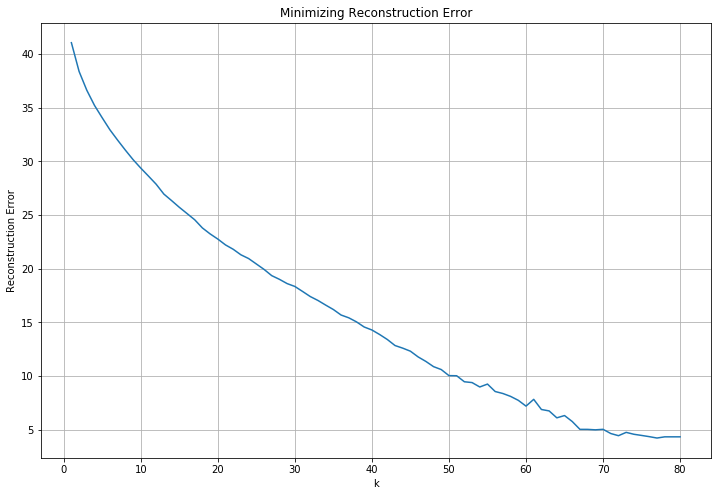

In [111]:
def fit_nmf(k):
    nmf = NMF(n_components=k)
    nmf.fit(mat)
    W = nmf.transform(mat);
    H = nmf.components_;
    return nmf.reconstruction_err_

plt.figure(figsize=(12,8))

error = [fit_nmf(i) for i in range(1,81)]
plt.plot(range(1,81), error)
plt.title("Minimizing Reconstruction Error")
plt.xlabel('k')
plt.ylabel('Reconstruction Error')
plt.grid(True)
# plt.savefig("k_rec_error.png");